# Import Modules

In [1]:
import PIL
from PIL import Image
import numpy as np
from PIL import ImageEnhance
from tensorflow.keras import datasets, layers, models
from mlflow.models.signature import infer_signature
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import json
from tensorflow.keras import datasets, layers, models
import mlflow
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16, ResNet50, InceptionV3, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
!pip install beautifulsoup4
from bs4 import BeautifulSoup
import requests
import urllib.request
import requests

StatementMeta(, , , Waiting, )

2024-06-13 13:54:42.625371: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-13 13:54:46.337590: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Preprocessing to resize images

Alter the data filepath and image filepath to run

StatementMeta(, , , Waiting, )

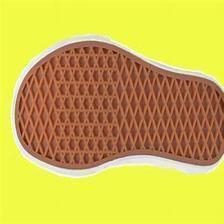

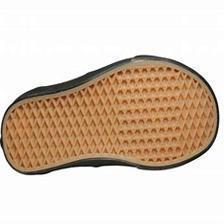

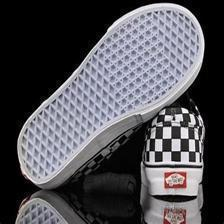

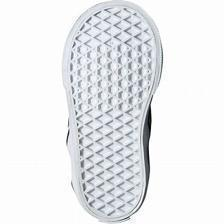

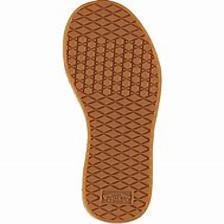

...

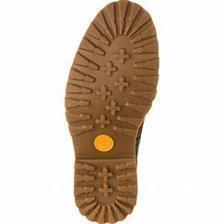

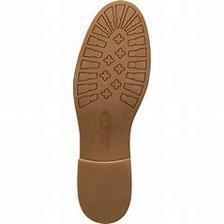

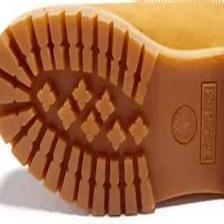

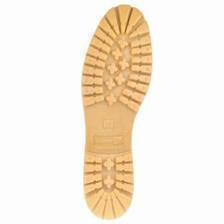

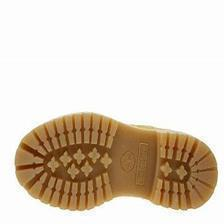

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        ...,
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686]],

       [[0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        ...,
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686]],

       [[0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        ...,
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686],
        [0.99215686, 0.99215686, 0.99215686]],

       ...,

       [[0.99215686, 0.99215686, 0.99215686],
        [0.99

In [2]:
def resize_image(image_paths) :

    for i,image_paths in enumerate(image_paths) :
        image = Image.open(image_paths)
        size = (224,224)
        image = image.resize(size)
        image.save(image_paths)
        image.show()
        image = tf.io.read_file(image_paths) ## remove the initial filepath for future use
        image = tf.image.decode_image(image,channels=3)
        image = tf.cast(image,tf.float32)
        image = image/255.0

    return image

data = pd.read_csv('/lakehouse/default/Files/shoe_details.csv')
resize_image('/lakehouse/default/Files/' + data['image_path'])

# Functions to Augment Dataset

In [3]:

def transform_image(imagePath,i,j,brand) :
    angles = np.linspace(5,350,5)
    for k,angle in enumerate(angles) :
        print(angle)
        image = Image.open(imagePath)
        rotate_image = image.rotate(angle)
        flipped_image = rotate_image.transpose(Image.FLIP_LEFT_RIGHT)
        image_name = '/lakehouse/default/Files/' + brand + '_shoe_data/' + brand + '_shoe_flip_'+ str(k) +'.jpg'
        flipped_image.save(image_name)
        data.append({'brand': brand, 'image_name': image_name})
    return data

def adjust_brightness(imagePath,i,j,brand,model,price,sizes,data):
    factors = np.linspace(1,1.9,5)
    for k,factor in enumerate(factors):
        image = Image.open(imagePath)
        enhancer = ImageEnhance.Brightness(image)
        adjusted_image = enhancer.enhance(factor)
        image_name = '/lakehouse/default/Files/' + brand + '_shoe_data/' + brand + '_shoe_adjust_'+ str(k) +'.jpg'
        adjusted_image.save(image_name)
        data.append({'brand': brand, 'image_name': image_name})
    return data


StatementMeta(, , , Waiting, )

# Download shoe details

In [4]:
# URL of vans shoes page

#create function to download images from a given url

def download_images(url,brand):

    nike_shoe_data = []

    for url in urls :
    # Send a GET request to the URL
        response = requests.get(url)

        # Parse the HTML content of the page
        soup = BeautifulSoup(response.text, 'html.parser')

        # Find all shoe items on the page
        shoe_items = soup.find_all('div', class_='product-card__body')
        
        for i, shoe in enumerate(shoe_items):
            url = shoe.find('a', class_='product-card__img-link-overlay')['href']
            model = shoe.find('div', class_='product-card__title').text.strip()
            price = shoe.find('div', class_='product-price').text.strip()
            
            # Extract shoe sizes and their corresponding measurements
            sizes = []
            size_elements = shoe.find_all('span', class_='css-1kj7abn')
            for size_element in size_elements:
                size_text = size_element.text.strip()
                # Extract the size and measurement separately
                size, measurement = size_text.split(' (')
                measurement = measurement[:-1]  # Remove trailing parenthesis
                sizes.append({'size': size, 'measurement': measurement})
            # Send a GET request to the URL
            response = requests.get(url)

            
            nike_shoe_data.append({'brand': brand, 'model': model, 'price': price, 'sizes': sizes})

    import os
    import json

    # Save JSON data to files section
    output_dir = '/lakehouse/default/Files/nike/'
    os.makedirs(output_dir, exist_ok=True)
    json_file_path = os.path.join(output_dir, 'nike_shoe_data.json')
    with open(json_file_path, 'w') as f:
        json.dump(nike_shoe_data, f)

    # Display the extracted vans shoe data
    # print(vans_shoe_data)

    # Create directories if they don't exist
    os.makedirs('/lakehouse/default/Files/nike', exist_ok=True)

    # Save JSON data to files section
    with open('/lakehouse/default/Files/nike/nike_shoe_data.json', 'w') as f:
            f.write(json.dumps(nike_shoe_data))


StatementMeta(, , , Waiting, )

In [5]:
brand = 'nike'
urls = ('https://www.nike.com/gb/w/mens-running-shoes-37v7jznik1zy7ok',
        'https://www.nike.com/gb/w/mens-lifestyle-shoes-13jrmznik1zy7ok')


download_images(urls,brand)

StatementMeta(, , , Waiting, )

In [6]:
df = spark.read.option("multiline", "true").json("Files/nike/nike_shoe_data.json")
# df now is a Spark DataFrame containing JSON data from "Files/nike/nike_shoe_data.json".
display(df)

StatementMeta(, , , Waiting, )

SynapseWidget(Synapse.DataFrame, 8a996026-33e7-4b7a-8dee-19d9d5d73056)

# Create Test and Train Datasets

In [ ]:
data = pd.read_csv("/lakehouse/default/" + "Files/shoe_details.csv")
# split data into features and labels and encode labels


def split_test_train(features,labels):

    X = features
    label_encoder = LabelEncoder()
    labels = label_encoder.fit_transform(labels)
    y = labels

    label_mapping = dict(zip(label_encoder.classes_,label_encoder.transform(label_encoder.classes_)))
    df_label_mapping = pd.DataFrame(list(label_mapping.items()),columns=['Category','Value'])
    df_label_mapping.to_csv('/lakehouse/default/Files/mapping.csv', index=False)

    # split data into training and testing

    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)

    return X_train,X_test,y_train,y_test

def load_and_preprocess_image(image_path, label):

    image = tf.io.read_file(image_path) ## remove the initial filepath for future use
    image = tf.image.decode_image(image,channels=3)
    image = tf.cast(image,tf.float32)
    image = image/255.0

    return(image,label)
    
def df_to_dataset(features,labels, batch_size=5) :

    IMG_HEIGHT,IMG_WIDTH = 224,224

    # map labels to numerical values

    dataset = tf.data.Dataset.from_tensor_slices((features,labels))
    dataset = dataset.map(lambda x,y: load_and_preprocess_image(x,y))

    #batch and shuffle the dataset
    shuffle_buffer_size = len(labels)
    dataset = dataset.shuffle(shuffle_buffer_size).batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    for batch in dataset.take(1):
        images,labels = batch
        print(images.shape, labels.shape)

    return dataset
X_train,X_test,y_train,y_test = split_test_train('/lakehouse/default/Files/' + data['image_path'],data['brand'])

test_dataset = df_to_dataset(X_test,y_test)
train_dataset = df_to_dataset(X_train,y_train)


StatementMeta(, , , Waiting, )

2024-06-13 13:56:16.339253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [12]
	 [[{{node Placeholder/_0}}]]
2024-06-13 13:56:16.339625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [12]
	 [[{{node Placeholder/_1}}]]


(5, 224, 224, 3) (5,)
(5, 224, 224, 3) (5,)


2024-06-13 13:56:16.624997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [48]
	 [[{{node Placeholder/_0}}]]
2024-06-13 13:56:16.625297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [48]
	 [[{{node Placeholder/_1}}]]


# Train  Tensor Flow Model

In [8]:
mlflow.set_experiment("classify_shoes")
mlflow.tensorflow.autolog()
with mlflow.start_run() as run:

    tf_id = run.info.run_id
    #create the convolutional base

    model = models.Sequential()
    model.add(layers.Conv2D(32,(3,3), activation='relu', input_shape = (224, 224, 3)))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(64,(3,3),activation='relu'))
    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Conv2D(64,(3,3),activation='relu'))

    #add dense layers on top

    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(4, activation='softmax')) # use softmax to return probability between 0-1

    model.compile(optimizer = 'adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics= ['accuracy'])
    
    #set number of epochs
    
    epochs = 20             
    history = model.fit(train_dataset,epochs=epochs, batch_size=5)
    
    # Evaluate the model

    test_loss, test_acc = model.evaluate(test_dataset, verbose = 2)

    print('\nTest accuracy:', test_acc)

    acc = history.history['accuracy']

    loss = history.history['loss']

StatementMeta(, , , Waiting, )

2024-06-13 13:56:21.113626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [48]
	 [[{{node Placeholder/_0}}]]
2024-06-13 13:56:21.113929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [48]
	 [[{{node Placeholder/_1}}]]
2024-06-13:13:56:21,168 WARNING  [tracking_store.py:153] log_inputs not supported


Epoch 1/20


 4/10 [===========>..................] - ETA: 0s - loss: 4.4103 - accuracy: 0.1500

 7/10 [====================>.........] - ETA: 0s - loss: 3.1268 - accuracy: 0.2286

 9/10 [==========================>...] - ETA: 0s - loss: 2.7521 - accuracy: 0.2000

10/10 [==============================] - ETA: 0s - loss: 2.6632 - accuracy: 0.2500

10/10 [==============================] - 5s 395ms/step - loss: 2.6632 - accuracy: 0.2500
Epoch 2/20


 7/10 [====================>.........] - ETA: 0s - loss: 1.3012 - accuracy: 0.3429

10/10 [==============================] - 1s 69ms/step - loss: 1.3412 - accuracy: 0.3958
Epoch 3/20


 2/10 [=====>........................] - ETA: 0s - loss: 0.9145 - accuracy: 0.7000

 3/10 [========>.....................] - ETA: 0s - loss: 1.2166 - accuracy: 0.5333

 5/10 [==============>...............] - ETA: 0s - loss: 1.1458 - accuracy: 0.4800

 7/10 [====================>.........] - ETA: 0s - loss: 1.0942 - accuracy: 0.5429

10/10 [==============================] - 1s 66ms/step - loss: 1.3147 - accuracy: 0.4792


Epoch 4/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.9673 - accuracy: 0.8000

 3/10 [========>.....................] - ETA: 0s - loss: 1.1358 - accuracy: 0.5333

 5/10 [==============>...............] - ETA: 0s - loss: 1.0303 - accuracy: 0.6000

 8/10 [=======================>......] - ETA: 0s - loss: 1.0254 - accuracy: 0.6000

10/10 [==============================] - 1s 65ms/step - loss: 0.9951 - accuracy: 0.6250


Epoch 5/20
 2/10 [=====>........................] - ETA: 0s - loss: 0.7088 - accuracy: 0.8000

 5/10 [==============>...............] - ETA: 0s - loss: 0.6137 - accuracy: 0.7600

 7/10 [====================>.........] - ETA: 0s - loss: 0.9584 - accuracy: 0.6857

10/10 [==============================] - 1s 64ms/step - loss: 0.9099 - accuracy: 0.7083
Epoch 6/20
 4/10 [===========>..................] - ETA: 0s - loss: 0.3802 - accuracy: 0.8500

 8/10 [=======================>......] - ETA: 0s - loss: 0.4395 - accuracy: 0.8500

10/10 [==============================] - ETA: 0s - loss: 0.4597 - accuracy: 0.8542

10/10 [==============================] - 1s 71ms/step - loss: 0.4597 - accuracy: 0.8542
Epoch 7/20


 3/10 [========>.....................] - ETA: 0s - loss: 0.5454 - accuracy: 0.8000

 5/10 [==============>...............] - ETA: 0s - loss: 0.5852 - accuracy: 0.8000

 7/10 [====================>.........] - ETA: 0s - loss: 0.5420 - accuracy: 0.8000

 9/10 [==========================>...] - ETA: 0s - loss: 0.4797 - accuracy: 0.8222

10/10 [==============================] - 1s 64ms/step - loss: 0.4708 - accuracy: 0.8333
Epoch 8/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.2394 - accuracy: 1.0000

 3/10 [========>.....................] - ETA: 0s - loss: 0.3192 - accuracy: 1.0000

 5/10 [==============>...............] - ETA: 0s - loss: 0.2187 - accuracy: 1.0000

 8/10 [=======================>......] - ETA: 0s - loss: 0.2292 - accuracy: 0.9250

10/10 [==============================] - 1s 66ms/step - loss: 0.2153 - accuracy: 0.9375


Epoch 9/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.0401 - accuracy: 1.0000

 3/10 [========>.....................] - ETA: 0s - loss: 0.1235 - accuracy: 0.9333

 6/10 [=================>............] - ETA: 0s - loss: 0.0911 - accuracy: 0.9667

10/10 [==============================] - 1s 65ms/step - loss: 0.1357 - accuracy: 0.9583
Epoch 10/20
 3/10 [========>.....................] - ETA: 0s - loss: 0.6214 - accuracy: 0.8667

 7/10 [====================>.........] - ETA: 0s - loss: 0.5424 - accuracy: 0.8286

 9/10 [==========================>...] - ETA: 0s - loss: 0.6326 - accuracy: 0.8444

10/10 [==============================] - 1s 64ms/step - loss: 0.6351 - accuracy: 0.8542
Epoch 11/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.2944 - accuracy: 1.0000

 3/10 [========>.....................] - ETA: 0s - loss: 0.7881 - accuracy: 0.7333

 5/10 [==============>...............] - ETA: 0s - loss: 0.6083 - accuracy: 0.8000

 7/10 [====================>.........] - ETA: 0s - loss: 0.6030 - accuracy: 0.7429

 9/10 [==========================>...] - ETA: 0s - loss: 0.5683 - accuracy: 0.7778

10/10 [==============================] - 1s 70ms/step - loss: 0.5572 - accuracy: 0.7917


Epoch 12/20
 2/10 [=====>........................] - ETA: 0s - loss: 0.1657 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.1745 - accuracy: 0.9500

 6/10 [=================>............] - ETA: 0s - loss: 0.2073 - accuracy: 0.9000

 8/10 [=======================>......] - ETA: 0s - loss: 0.1698 - accuracy: 0.9250

10/10 [==============================] - 1s 75ms/step - loss: 0.1439 - accuracy: 0.9375


Epoch 13/20
 2/10 [=====>........................] - ETA: 0s - loss: 0.0528 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.0266 - accuracy: 1.0000

10/10 [==============================] - ETA: 0s - loss: 0.0808 - accuracy: 0.9792

10/10 [==============================] - 1s 65ms/step - loss: 0.0808 - accuracy: 0.9792
Epoch 14/20
 2/10 [=====>........................] - ETA: 0s - loss: 0.7592 - accuracy: 0.8000

 4/10 [===========>..................] - ETA: 0s - loss: 0.3950 - accuracy: 0.9000

 7/10 [====================>.........] - ETA: 0s - loss: 0.3082 - accuracy: 0.9143

 9/10 [==========================>...] - ETA: 0s - loss: 0.2538 - accuracy: 0.9333

10/10 [==============================] - 1s 65ms/step - loss: 0.2379 - accuracy: 0.9375


Epoch 15/20
 1/10 [==>...........................] - ETA: 0s - loss: 5.7663e-04 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.0925 - accuracy: 1.0000

 6/10 [=================>............] - ETA: 0s - loss: 0.1078 - accuracy: 1.0000

 8/10 [=======================>......] - ETA: 0s - loss: 0.0838 - accuracy: 1.0000

10/10 [==============================] - 1s 66ms/step - loss: 0.0946 - accuracy: 1.0000
Epoch 16/20


 2/10 [=====>........................] - ETA: 0s - loss: 0.0448 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.0354 - accuracy: 1.0000

 7/10 [====================>.........] - ETA: 0s - loss: 0.0203 - accuracy: 1.0000

 9/10 [==========================>...] - ETA: 0s - loss: 0.0650 - accuracy: 0.9778

10/10 [==============================] - 1s 86ms/step - loss: 0.0610 - accuracy: 0.9792
Epoch 17/20
 4/10 [===========>..................] - ETA: 0s - loss: 0.2907 - accuracy: 0.9500

 7/10 [====================>.........] - ETA: 0s - loss: 0.1885 - accuracy: 0.9714

 9/10 [==========================>...] - ETA: 0s - loss: 0.1473 - accuracy: 0.9778

10/10 [==============================] - 1s 69ms/step - loss: 0.1382 - accuracy: 0.9792
Epoch 18/20


 2/10 [=====>........................] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.0388 - accuracy: 1.0000

 6/10 [=================>............] - ETA: 0s - loss: 0.0371 - accuracy: 1.0000

 9/10 [==========================>...] - ETA: 0s - loss: 0.0249 - accuracy: 1.0000

10/10 [==============================] - 1s 66ms/step - loss: 0.0392 - accuracy: 0.9792


Epoch 19/20
 2/10 [=====>........................] - ETA: 0s - loss: 5.5151e-04 - accuracy: 1.0000

 4/10 [===========>..................] - ETA: 0s - loss: 0.3886 - accuracy: 0.9000

 6/10 [=================>............] - ETA: 0s - loss: 0.2594 - accuracy: 0.9333

 9/10 [==========================>...] - ETA: 0s - loss: 0.3078 - accuracy: 0.9333

10/10 [==============================] - 1s 67ms/step - loss: 0.2886 - accuracy: 0.9375


Epoch 20/20
 2/10 [=====>........................] - ETA: 0s - loss: 0.1117 - accuracy: 1.0000

 9/10 [==========================>...] - ETA: 0s - loss: 0.1096 - accuracy: 1.0000

1/1 [==============================] - 0s 117ms/step


2024-06-13 13:56:42.624967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [48]
	 [[{{node Placeholder/_1}}]]
2024-06-13 13:56:42.625191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [48]
	 [[{{node Placeholder/_0}}]]


Found untraced functions such as _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _update_step_xla while saving (showing 4 of 4). These functions will not be directly callable after loading.


2024/06/13 13:56:50 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."


3/3 - 0s - loss: 2.4461 - accuracy: 0.4167 - 163ms/epoch - 54ms/step


2024-06-13 13:56:53.489088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [12]
	 [[{{node Placeholder/_0}}]]
2024-06-13 13:56:53.489308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [12]
	 [[{{node Placeholder/_1}}]]



Test accuracy: 0.4166666567325592


# Using Pre-trained Model

MobileNetV2

In [9]:
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation,RandomZoom
mlflow.set_experiment("classify_shoes")
mlflow.tensorflow.autolog()


with mlflow.start_run() as run:

    data_augmentation = tf.keras.Sequential([

        RandomFlip("horizontal",input_shape= (224,224,3)),
        RandomRotation(factor=0.4),
        RandomZoom(height_factor = 0.2,width_factor = 0.2),
        ])

    base_model = MobileNetV2(weights='imagenet',
                 include_top = False,
                 input_shape = (224,224,3))

    inputs = tf.keras.Input(shape=(224,224,3))

    x = data_augmentation(inputs)
    x = base_model(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)

    predictions = Dense(5, activation='softmax')(x)

    model = Model(inputs = inputs, outputs = predictions)

    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])

    history = model.fit(train_dataset, epochs = 4,validation_data = test_dataset)

    test_loss, test_acc = model.evaluate(test_dataset, verbose = 2)

    print('\nTest accuracy:', test_acc)

    acc = history.history['accuracy']

    loss = history.history['loss']

StatementMeta(, , , Waiting, )

   8192/9406464 [..............................] - ETA: 0s

9406464/9406464 [==============================] - 0s 0us/step


2024-06-13:13:56:58,23 WARNING  [tracking_store.py:153] log_inputs not supported
2024-06-13:13:56:58,50 WARNING  [tracking_store.py:153] log_inputs not supported


Epoch 1/4


 5/10 [==============>...............] - ETA: 0s - loss: 1.5016 - accuracy: 0.5200

 9/10 [==========================>...] - ETA: 0s - loss: 1.1453 - accuracy: 0.6444

10/10 [==============================] - 5s 238ms/step - loss: 1.0854 - accuracy: 0.6667 - val_loss: 1.0437 - val_accuracy: 0.7500
Epoch 2/4


 5/10 [==============>...............] - ETA: 0s - loss: 0.1311 - accuracy: 0.9600

 9/10 [==========================>...] - ETA: 0s - loss: 0.2304 - accuracy: 0.9333

10/10 [==============================] - 1s 58ms/step - loss: 0.2162 - accuracy: 0.9375 - val_loss: 1.4845 - val_accuracy: 0.6667
Epoch 3/4
 1/10 [==>...........................] - ETA: 0s - loss: 0.8015 - accuracy: 0.8000

10/10 [==============================] - 1s 56ms/step - loss: 0.1449 - accuracy: 0.9583 - val_loss: 0.3856 - val_accuracy: 0.9167
Epoch 4/4
 1/10 [==>...........................] - ETA: 0s - loss: 0.7220 - accuracy: 0.8000

 8/10 [=======================>......] - ETA: 0s - loss: 0.0921 - accuracy: 0.9750

10/10 [==============================] - 1s 62ms/step - loss: 0.0767 - accuracy: 0.9792 - val_loss: 0.5287 - val_accuracy: 0.9167


2024-06-13 13:57:06.306359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [48]
	 [[{{node Placeholder/_1}}]]
2024-06-13 13:57:06.306630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [48]
	 [[{{node Placeholder/_1}}]]


1/1 [==============================] - 1s 596ms/step


2024-06-13 13:57:07.522243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'random_flip_input' with dtype float and shape [?,224,224,3]
	 [[{{node random_flip_input}}]]
2024-06-13 13:57:07.631066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:57:07.642923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'random_flip_input' with dtype float and shape [

2024-06-13 13:57:11.338976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'input_2' with dtype float and shape [?,224,224,3]
	 [[{{node input_2}}]]
2024-06-13 13:57:11.529463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:57:11.678120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'input_2' with dtype float and shape [?,224,224,3]
	 [[{{node input_

2024-06-13 13:57:12.407811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:57:13.221014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]


2024-06-13 13:57:14.301435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:57:14.333955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:57:14.387711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]

Found untraced functions such as _update_step_xla, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op while saving (showing 5 of 53). These functions will not be directly callable after loading.


3/3 - 0s - loss: 0.5287 - accuracy: 0.9167 - 202ms/epoch - 67ms/step

Test accuracy: 0.9166666865348816


# Create Prediction Dataset
(no labels)

StatementMeta(, , , Waiting, )

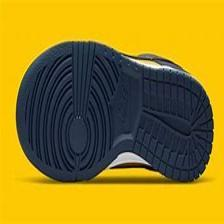

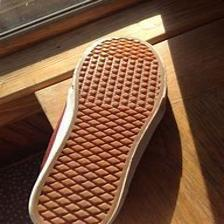

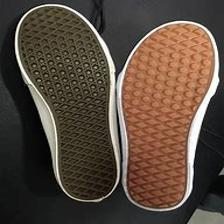

2024-06-13 13:57:33.837025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [3]
	 [[{{node Placeholder/_0}}]]


In [10]:
import PIL
from PIL import Image
import numpy as np
import pandas as pd
def load_and_preprocess_image(image_path):

    image = tf.io.read_file('/lakehouse/default/Files/' + image_path) ## remove the initial filepath for future use
    image = tf.image.decode_image(image,channels=3)
    image = tf.cast(image,tf.float32)
    image = image/255.0

    return(image)
    
def df_to_dataset_predict(image_paths, batch_size=32) :

    IMG_HEIGHT,IMG_WIDTH = 224,224

    # map labels to numerical values

    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(lambda x :load_and_preprocess_image(x))

    #batch and shuffle the dataset
   
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    for batch in dataset.take(1):
        images = batch


    return dataset

data = pd.read_csv('/lakehouse/default/Files/predict.csv')

def resize_image(image_paths) :

    for i,image_paths in enumerate(image_paths) :
        image = Image.open(image_paths)
        size = (224,224)
        image = image.resize(size)
        image.save(image_paths)
        image.show()

    return image

data = pd.read_csv('/lakehouse/default/Files/predict.csv')
resize_image('/lakehouse/default/Files/' + data['image_path'])

dataset_predict = df_to_dataset_predict(data['image_path'])



In [11]:


import pandas as pd
# Load data into pandas DataFrame from "/lakehouse/default/" + "Files/predict.csv"
df = pd.read_csv("/lakehouse/default/" + "Files/predict.csv")
display(df['image_path'])



StatementMeta(, , , Waiting, )

0    predict/1.jpg
1    predict/2.jpg
2    predict/3.jpg
Name: image_path, dtype: object

# Predict

In [12]:
from PIL import Image

prediction = model.predict(dataset_predict)
class_labels = np.argmax(prediction,axis = 1)
df = spark.read.format("csv").option("header","true").load("Files/mapping.csv")


print(class_labels)


StatementMeta(, , , Waiting, )

2024-06-13 13:57:36.174998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [3]
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 1s 568ms/step


[1 3 3]


# Show Predictions

StatementMeta(, , , Waiting, )

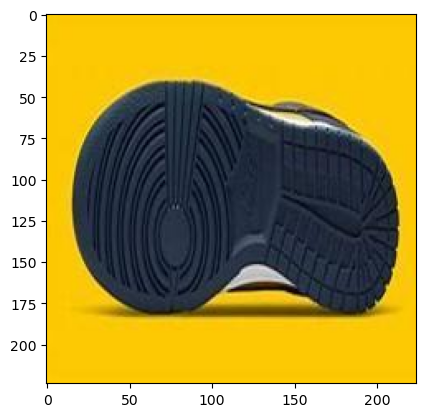

Predicted Class Labels: ['nike'] Probability: [0.99999917]


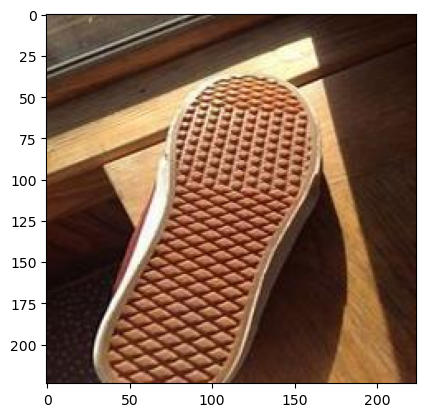

Predicted Class Labels: ['vans'] Probability: [0.9999999]


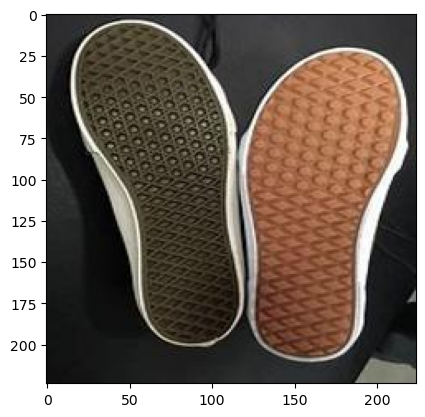

Predicted Class Labels: ['vans'] Probability: [0.9995003]


In [13]:
for i,value in enumerate(class_labels):
        predicted_labels =[]
        prediction_probabilities = []
        image = []
        original_image_path = []
        class_label = df.filter(df['Value'] == value).select('Category').collect()[0][0]
        predicted_labels.append(class_label)
        prediction_probabilities.append(prediction[i][value])
        image_path = data['image_path'].iloc[i]
        image_path = Image.open('/lakehouse/default/Files/' + image_path)
        image_array = np.array(image_path)
        image.append(image_array)

        plt.imshow(image_array)
        plt.show()

        print("Predicted Class Labels:", predicted_labels,"Probability:",prediction_probabilities)




StatementMeta(, , , Waiting, )

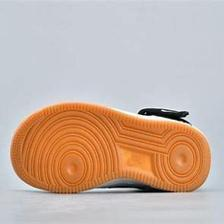

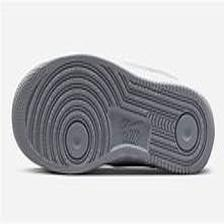

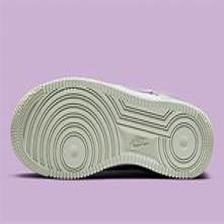

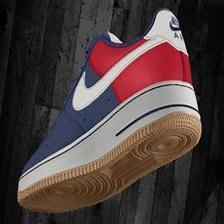

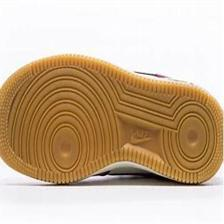

...

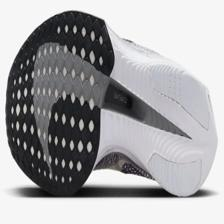

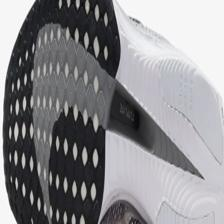

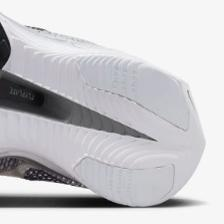

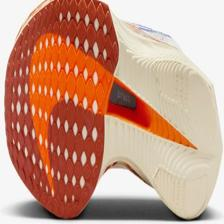

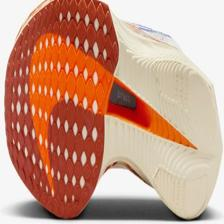

In [14]:
import os
import pandas

data = []
brand = 'nike'

folder_path = '/lakehouse/default/Files/' + brand  # Path to look through

for model in os.listdir(folder_path):
    model_path = os.path.join(folder_path,model)
    if os.path.isdir(model_path):

        for image in os.listdir(model_path):
            data.append({'image_path': os.path.join(model_path,image),'model':model})

data = pd.DataFrame(data)

resize_image(data['image_path'])

In [15]:

def split_test_train(features,labels):

    X = features
    label_encoder = LabelEncoder()
    labels = label_encoder.fit_transform(labels)
    y = labels

    label_mapping = dict(zip(label_encoder.classes_,label_encoder.transform(label_encoder.classes_)))
    df_label_mapping = pd.DataFrame(list(label_mapping.items()),columns=['Category','Value'])
    df_label_mapping.to_csv('/lakehouse/default/Files/mapping.csv', index=False)

    # split data into training and testing

    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)

    return X_train,X_test,y_train,y_test

def load_and_preprocess_image(image_path, label):

    image = tf.io.read_file(image_path) ## remove the initial filepath for future use
    image = tf.image.decode_image(image,channels=3)
    image = tf.cast(image,tf.float32)
    image = image/255.0

    return(image,label)
    
def df_to_dataset(features,labels, batch_size=5) :

    IMG_HEIGHT,IMG_WIDTH = 224,224

    # map labels to numerical values

    dataset = tf.data.Dataset.from_tensor_slices((features,labels))
    dataset = dataset.map(lambda x,y: load_and_preprocess_image(x,y))

    #batch and shuffle the dataset
    shuffle_buffer_size = len(labels)
    dataset = dataset.shuffle(shuffle_buffer_size).batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    for batch in dataset.take(1):
        images,labels = batch
        print(images.shape, labels.shape)

    return dataset
X_train,X_test,y_train,y_test = split_test_train(data['image_path'],data['model'])

test_dataset = df_to_dataset(X_test,y_test)
train_dataset = df_to_dataset(X_train,y_train)


StatementMeta(, , , Waiting, )

(5, 224, 224, 3) (5,)
(5, 224, 224, 3) (5,)


2024-06-13 13:57:55.620965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [21]
	 [[{{node Placeholder/_1}}]]
2024-06-13 13:57:55.621219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [21]
	 [[{{node Placeholder/_1}}]]
2024-06-13 13:57:55.652366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [83]
	 [[{{n

In [19]:
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation,RandomZoom
mlflow.set_experiment("classify_shoes")
mlflow.tensorflow.autolog()


with mlflow.start_run() as run:

    data_augmentation = tf.keras.Sequential([

        RandomFlip("horizontal",input_shape= (224,224,3)),
        RandomRotation(factor=0.4),
        RandomZoom(height_factor = 0.2,width_factor = 0.2),
        ])

    base_model = MobileNetV2(weights='imagenet',
                 include_top = False,
                 input_shape = (224,224,3))

    inputs = tf.keras.Input(shape=(224,224,3))

    x = data_augmentation(inputs)
    x = base_model(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)

    predictions = Dense(6, activation='softmax')(x)

    model = Model(inputs = inputs, outputs = predictions)

    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

    history = model.fit(train_dataset, epochs = 4,validation_data = test_dataset)

    test_loss, test_acc = model.evaluate(test_dataset, verbose = 2)

    print('\nTest accuracy:', test_acc)

    acc = history.history['accuracy']

    loss = history.history['loss']

StatementMeta(, , , Waiting, )

2024-06-13 13:57:58.559262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [83]
	 [[{{node Placeholder/_1}}]]
2024-06-13 13:57:58.559484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [83]
	 [[{{node Placeholder/_1}}]]
2024-06-13:13:57:58,631 WARNING  [tracking_store.py:153] log_inputs not supported
2024-06-13 13:57:58.633033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a val

Epoch 1/4


/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


 5/17 [=======>......................] - ETA: 0s - loss: 2.5499 - accuracy: 0.3200

11/17 [==================>...........] - ETA: 0s - loss: 2.5421 - accuracy: 0.3636

17/17 [==============================] - ETA: 0s - loss: 2.1476 - accuracy: 0.4578

17/17 [==============================] - 4s 140ms/step - loss: 2.1476 - accuracy: 0.4578 - val_loss: 0.8214 - val_accuracy: 0.7619
Epoch 2/4


12/17 [====================>.........] - ETA: 0s - loss: 1.4083 - accuracy: 0.6500

17/17 [==============================] - 1s 57ms/step - loss: 1.2752 - accuracy: 0.6747 - val_loss: 0.9486 - val_accuracy: 0.8095
Epoch 3/4
 4/17 [======>.......................] - ETA: 0s - loss: 0.7482 - accuracy: 0.8000

17/17 [==============================] - ETA: 0s - loss: 0.4079 - accuracy: 0.8434

17/17 [==============================] - 1s 60ms/step - loss: 0.4079 - accuracy: 0.8434 - val_loss: 0.6356 - val_accuracy: 0.8095
Epoch 4/4


 4/17 [======>.......................] - ETA: 0s - loss: 0.2234 - accuracy: 0.9000

10/17 [================>.............] - ETA: 0s - loss: 0.4074 - accuracy: 0.8800

16/17 [===========================>..] - ETA: 0s - loss: 0.3721 - accuracy: 0.8625

17/17 [==============================] - 1s 56ms/step - loss: 0.3666 - accuracy: 0.8675 - val_loss: 1.4450 - val_accuracy: 0.6667


2024-06-13 13:58:07.967980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [83]
	 [[{{node Placeholder/_0}}]]
2024-06-13 13:58:07.968208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int64 and shape [83]
	 [[{{node Placeholder/_1}}]]


1/1 [==============================] - 1s 1s/step


2024-06-13 13:58:09.520051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'random_flip_1_input' with dtype float and shape [?,224,224,3]
	 [[{{node random_flip_1_input}}]]
2024-06-13 13:58:09.637245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:58:09.651130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'random_flip_1_input' with dtype float and s

2024-06-13 13:58:13.798719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'input_4' with dtype float and shape [?,224,224,3]
	 [[{{node input_4}}]]
2024-06-13 13:58:14.062442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:58:14.504009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}

2024-06-13 13:58:15.288390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:58:16.351431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]]
2024-06-13 13:58:16.383402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,224,224,3]
	 [[{{node inputs}}]

Found untraced functions such as _update_step_xla, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op while saving (showing 5 of 53). These functions will not be directly callable after loading.


5/5 - 0s - loss: 1.4450 - accuracy: 0.6667 - 167ms/epoch - 33ms/step

Test accuracy: 0.6666666865348816


In [20]:
import PIL
from PIL import Image
import numpy as np
import pandas as pd
def load_and_preprocess_image(image_path):

    image = tf.io.read_file(image_path) ## remove the initial filepath for future use
    image = tf.image.decode_image(image,channels=3)
    image = tf.cast(image,tf.float32)
    image = image/255.0

    return(image)
    
def df_to_dataset_predict(image_paths, batch_size=32) :

    IMG_HEIGHT,IMG_WIDTH = 224,224

    # map labels to numerical values

    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(lambda x :load_and_preprocess_image(x))

    #batch and shuffle the dataset
   
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    for batch in dataset.take(1):
        images = batch


    return dataset

def resize_image(image_paths) :

    for i,image_paths in enumerate(image_paths) :
        image = Image.open(image_paths)
        size = (224,224)
        image = image.resize(size)
        image.save(image_paths)
        image.show()

    return image

data = data[data['image_path'].str.contains('3')]

dataset_predict = df_to_dataset_predict(data['image_path'])



StatementMeta(, , , Waiting, )

2024-06-13 13:59:45.703574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [29]
	 [[{{node Placeholder/_0}}]]


In [21]:
from PIL import Image

prediction = model.predict(dataset_predict)
print(prediction)
class_labels = np.argmax(prediction,axis = 1)
df = spark.read.format("csv").option("header","true").load("Files/mapping.csv")


print(class_labels)


StatementMeta(, , , Waiting, )

2024-06-13 13:59:55.991868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [29]
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 0s 306ms/step


[[3.57334060e-03 7.19873606e-06 2.27722136e-04 2.89734453e-03
  9.93290663e-01 3.69731038e-06]
 [3.30787007e-04 3.10063427e-07 1.05250374e-05 6.00614876e-04
  9.99057472e-01 3.91305463e-07]
 [3.06338049e-03 8.28892291e-01 4.65503056e-03 4.96094022e-03
  1.41242892e-01 1.71854571e-02]
 [6.05662819e-04 5.43144464e-01 1.22032613e-02 1.49838091e-03
  4.33928967e-01 8.61931592e-03]
 [3.86475676e-06 9.86084163e-01 1.24589598e-04 3.22107117e-05
  1.30198849e-02 7.35292910e-04]
 [7.78229005e-05 8.23786497e-01 5.36332140e-04 9.05132946e-03
  6.66732565e-02 9.98747349e-02]
 [1.65746576e-04 1.51125168e-05 9.96660829e-01 1.64499535e-04
  2.97171506e-03 2.21709997e-05]
 [2.05547622e-04 3.44537548e-04 1.06115163e-04 1.00990161e-01
  8.98266673e-01 8.69127398e-05]
 [2.17896583e-03 7.22674578e-02 1.09240850e-02 2.13012695e-02
  8.87554169e-01 5.77408867e-03]
 [1.66080846e-03 9.25160071e-04 2.53808009e-03 2.50523281e-03
  9.89903688e-01 2.46708421e-03]
 [1.06582405e-07 1.52177151e-07 1.48853769e-06 5.8

[4 4 1 1 1 1 2 4 4 4 4 5 5 5 5 5 4 5 5 5 5 5 5 5 5 5 5 5 5]


# Write Predictions to Table

In [44]:
from pyspark.sql.types import StructType, StructField, DecimalType, StringType, IntegerType

class_labels = []
prediction_probabilities = []
image_paths = []
prediction_data = []
for i in range(len(prediction)):
    for j in range(len(prediction[i])) :

        prediction_probabilities.append(prediction[i][j])
        class_labels.append(j)
        image_paths.append(data['image_path'].iloc[i])
        prediction_data.append({'probabilities' : float(prediction[i][j]),'class_labels': j,'image_path': data['image_path'].iloc[i]})


schema = StructType([
        StructField('probabilities',FloatType(),True),
        StructField('class_labels',IntegerType(),True),
        StructField('image_path', StringType(),True)
])
prediction_df = spark.createDataFrame(prediction_data, schema)
prediction_df.write.format('delta').saveAsTable('tbl_F_Predictions')



StatementMeta(, , , Waiting, )

# Get image url from file path

In [ ]:
url_path = 'https://onelake.dfs.fabric.microsoft.com/326e5bbd-71de-4f4d-a909-8f04444fd8d9/2c7cf701-3491-4f26-bab4-17597ac9fea6/'

def ulr_generator(url_path,image_name):
    


In [ ]:
%%sql
SELECT *
from tbl_f_predictions

StatementMeta(, , , Waiting, )

<Spark SQL result set with 174 rows and 3 fields>

In [ ]:
df = spark.read.format("csv").option("header","true").load("Files/mapping.csv")
# df now is a Spark DataFrame containing CSV data from "Files/mapping.csv".
display(df)

StatementMeta(, , , Waiting, )

SynapseWidget(Synapse.DataFrame, 05cbc8f8-ea8a-43f4-bc33-c28bae49af7f)

StatementMeta(, 56ee6224-38c0-45c1-9cad-711e94b39a5a, 63, Finished, Available)

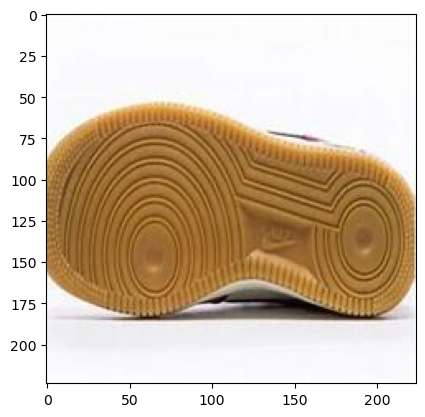

Predicted Class Labels: ['Nike Air Force 1 Low'] Probability: [0.68660355]


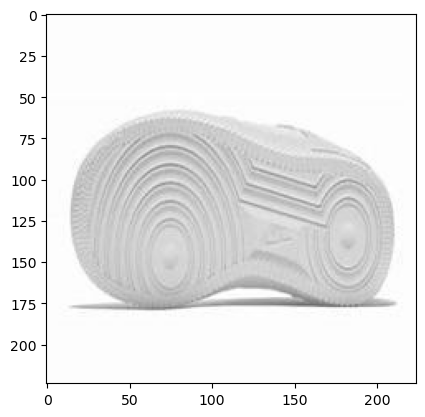

Predicted Class Labels: ['Nike Air Force 1 Low'] Probability: [0.5324743]


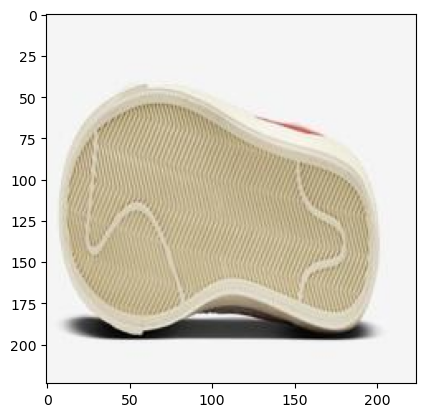

Predicted Class Labels: ['Nike Blazer Low'] Probability: [0.90704894]


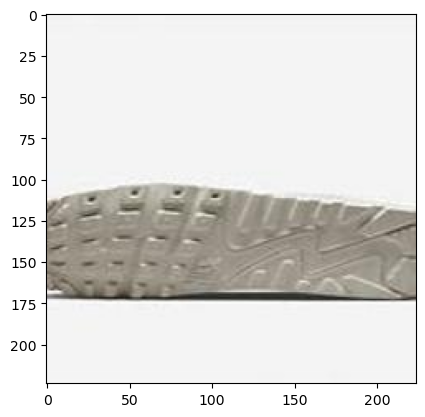

Predicted Class Labels: ['Nike Air Max 90'] Probability: [0.99623835]


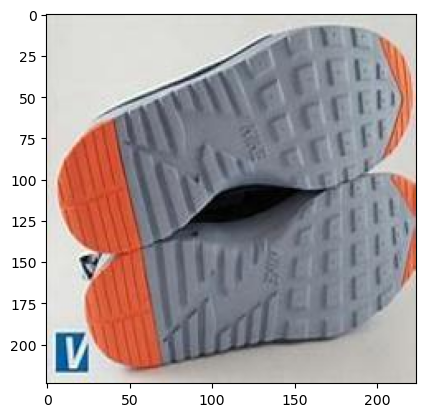

Predicted Class Labels: ['Nike Air Max 90'] Probability: [0.93105084]


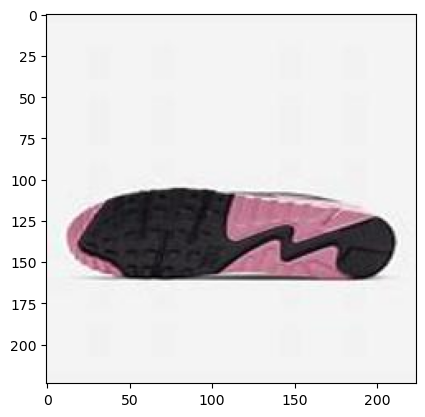

Predicted Class Labels: ['Nike Air Max 90'] Probability: [0.91329306]


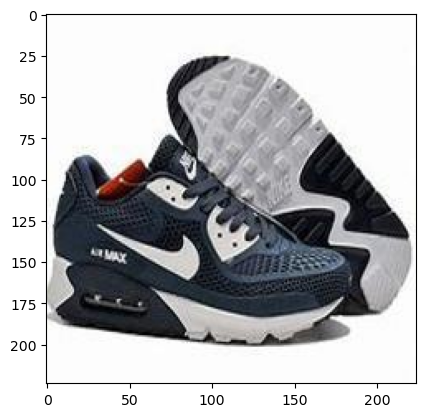

Predicted Class Labels: ['Nike Air Max 90'] Probability: [0.5902904]


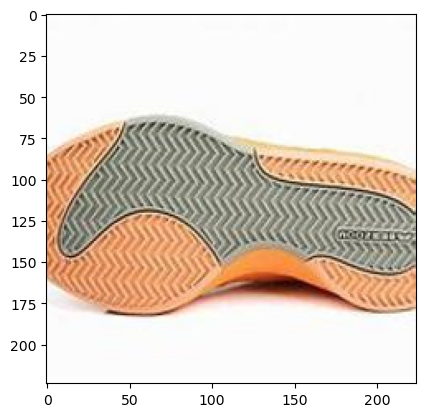

Predicted Class Labels: ['Nike Book 1'] Probability: [0.5995575]


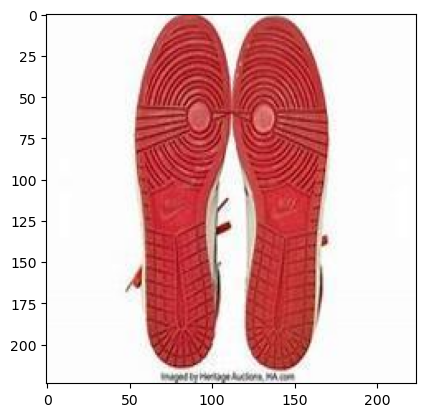

Predicted Class Labels: ['Nike Dunk'] Probability: [0.6241392]


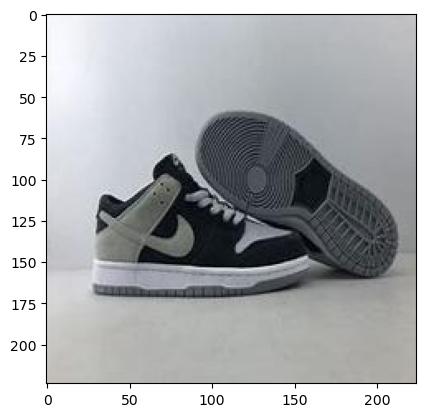

Predicted Class Labels: ['Nike Dunk'] Probability: [0.79217416]


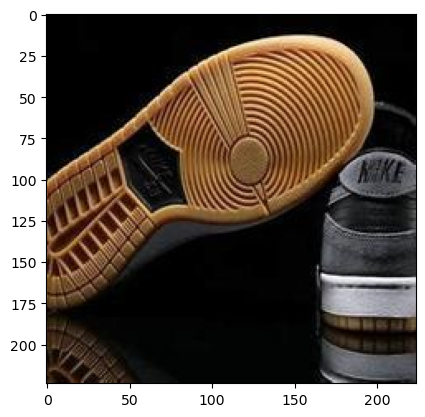

Predicted Class Labels: ['Nike Dunk'] Probability: [0.9795461]


In [61]:
for i,value in enumerate(class_labels):
        predicted_labels =[]
        prediction_probabilities = []
        image = []
        original_image_path = []
        class_label = df.filter(df['Value'] == value).select('Category').collect()[0][0]
        predicted_labels.append(class_label)
        prediction_probabilities.append(prediction[i][value])
        image_path = data['image_path'].iloc[i]
        image_path = Image.open(image_path)
        image_array = np.array(image_path)
        image.append(image_array)

        plt.imshow(image_array)
        plt.show()

        print("Predicted Class Labels:", predicted_labels,"Probability:",prediction_probabilities)


StatementMeta(, 114a97f5-a3ff-484f-8fae-8529e2d79f2c, 5, Finished, Available)


Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

--no-binary option requires 1 argument
shoe length: 170 shoe width 60


<Figure size 640x480 with 0 Axes>

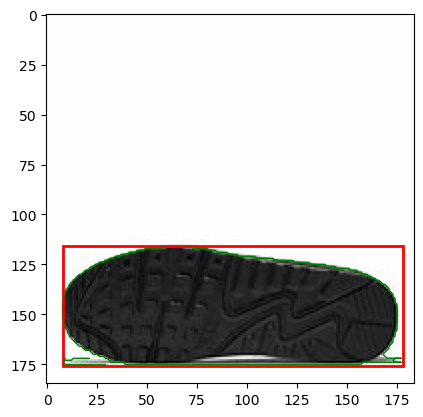

lenght to width ratio = 0.35294117647058826


In [3]:
!pip install opencv-python-headless
!pip install opencv-contrib-python-headless
!pip install opencv-python --no-binary

import cv2
import numpy as np
from PIL import Image,ImageDraw
import matplotlib.pyplot as plt
import matplotlib.patches as patches


image = cv2.imread('/lakehouse/default/Files/size-measurements/18.jpg')

#set image to greyscale

greyscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(greyscale_image,(5,5),0)


#find contours, create rectangle from the largest
edges = cv2.Canny(blur,50,150)
contours, hierarchy = cv2.findContours(edges,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
largest = max(contours, key = cv2.contourArea)

x,y,w,h = cv2.boundingRect(largest)

shoe_length = w
shoe_width = h

print('shoe length:',shoe_length,'shoe width',shoe_width)
# contour_image = cv2.drawContours(image,[largest],-1,(0,255,2),2)
plt.clf()
fig,ax = plt.subplots()

ax.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))

for contour in contours:
    ax.plot(contour[:,0,0],contour[:,0,1],'g',linewidth=1)

#add rectangle for largest measurements
rectangle = patches.Rectangle((x,y),w,h,linewidth = 2,edgecolor='red',facecolor='none')

ax.add_patch(rectangle)

plt.show()

print('length to width ratio =', w/h)
